<a href="https://colab.research.google.com/github/Trev621/GenAI/blob/main/HW4/Problem1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Author: Trevor Lacoste
The purpose of this assignment is to build and train a Generative Adversarial Network (GAN) using the LSUN (Large-scale Scene Understanding) dataset, specifically focusing on the bedroom category. The goal is to train the GAN to generate realistic bedroom images based on the patterns learned from the training data.

In [1]:
!pip install -q tensorflow-docs
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import tensorflow_docs.vis.embed as embed
import os
import PIL
import time
import random
import shutil
import imageio
import glob


from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from IPython import display
from sklearn.model_selection import train_test_split
from PIL import Image
from IPython import display

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.5/182.5 kB 5.2 MB/s eta 0:00:00


### 1. Downloading and preprocessing the LSUN dataset

In [2]:
#Loading data
!kaggle datasets download -d jhoward/lsun_bedroom -p /content/lsun_bedrooms --unzip

Dataset URL: https://www.kaggle.com/datasets/jhoward/lsun_bedroom
License(s): ODbL-1.0
100% 8.88G/8.89G [00:56<00:00, 191MB/s]
100% 8.89G/8.89G [00:56<00:00, 168MB/s]


In [3]:
#File paths
path = '/content/lsun_bedrooms/data0/lsun/bedroom'
subset_path = '/content/lsun_bedrooms_subset'
os.makedirs(subset_path, exist_ok=True)

num_images = 40000 #Number of images in subset

all_images = []
for root, dirs, files in os.walk(path): #Pulls the images from the subfolders so they can be randomly sampled
  for file in files:
    all_images.append(os.path.join(root, file))

sample_images = random.sample(all_images, num_images) #Randomly selects 40,000 images

for img_path in sample_images: #Puts the sampled images into the subset folder
  shutil.copy(img_path, subset_path)

In [4]:
subset_class_dir = os.path.join(subset_path, 'bedrooms') #Creating a class in the subset folder
os.makedirs(subset_class_dir, exist_ok=True)

#Moves the images to the class so they can be preprocessed
for img_file in os.listdir(subset_path):
    img_path = os.path.join(subset_path, img_file)
    if os.path.isfile(img_path): #Checks if it's an image
        shutil.move(img_path, subset_class_dir)

In [5]:
def preprocess_image(image):
    image = tf.image.resize(image, [64, 64]) #Rescale images to 64x64 pixels
    image = (image - 127.5) / 127.5 #Normalize
    return image

#Creating tensorflow dataset
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    subset_path,
    image_size=(64, 64),
    batch_size=256
).map(lambda x, y: preprocess_image(x))

Found 40000 files belonging to 1 classes.


## 2. Creating the generator and the discriminator

In [6]:
#Generator
def make_generator_model():
    model = tf.keras.Sequential()

    #Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    #Reshape layer
    model.add(layers.Reshape((8, 8, 256)))

    #Transposed convolution layers for upsampling
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    #Output
    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh')) #Color channel changed to RGB
    return model

In [7]:
#Discriminator
def make_discriminator_model():
    model = tf.keras.Sequential()

    #Convolutional layers
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[64, 64, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    #Flatten and output layers
    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [8]:
generator = make_generator_model()
discriminator = make_discriminator_model()

#Model summaries
generator.summary()
discriminator.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 16384)               │       1,638,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 16384)               │          65,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 128)         │         819,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 64)          │         204,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 3)           │           4,800 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,733,504 (10.43 MB)

 Trainable params: 2,700,352 (10.30 MB)

 Non-trainable params: 33,152 (129.50 KB)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │          16,385 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,045,633 (3.99 MB)

 Trainable params: 1,045,633 (3.99 MB)

 Non-trainable params: 0 (0.00 B)

## Define the loss and optimizers


In [9]:
#This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#Discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

#Generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

#Optimizers
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

## 3. Training the GAN

In [10]:
#Parameters
EPOCHS = 50
BATCH_SIZE = 256
noise_dim = 100
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, noise_dim])

#Training code from example
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()
        for image_batch in dataset:
            train_step(image_batch)
        generate_and_save_images(generator, epoch + 1, seed)
        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

In [11]:
#Creating new images
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] * 127.5 + 127.5).numpy().astype("uint8"))
        plt.axis("off")

    plt.savefig(f'generated_image_epoch_{epoch:03d}.png') #For GIF
    plt.show()
    plt.close(fig)

In [12]:
#Creating a GIF and saving it into files
def create_progression_gif():
    anim_file = 'progression.gif'

    with imageio.get_writer(anim_file, mode='I', duration=0.5) as writer:
        filenames = sorted(glob.glob('generated_image_epoch_*.png'))
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)

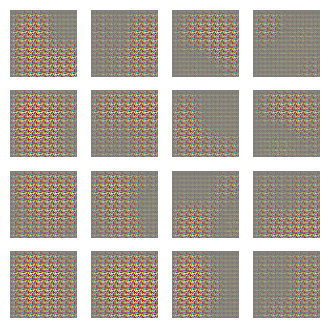

Time for epoch 1 is 52.22463917732239 sec


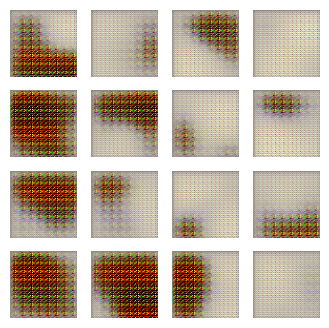

Time for epoch 2 is 39.530574560165405 sec


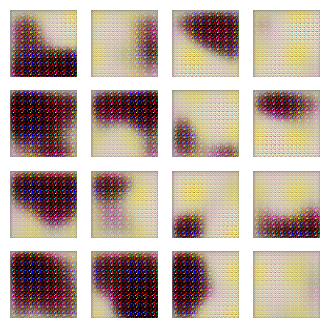

Time for epoch 3 is 40.65269494056702 sec


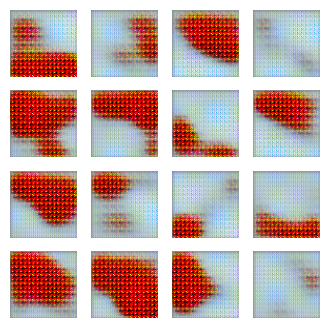

Time for epoch 4 is 40.83601975440979 sec


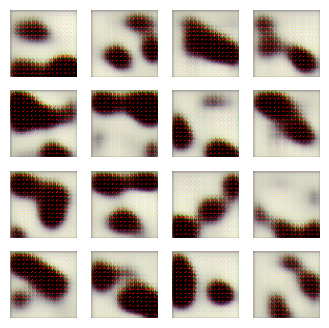

Time for epoch 5 is 40.581496715545654 sec


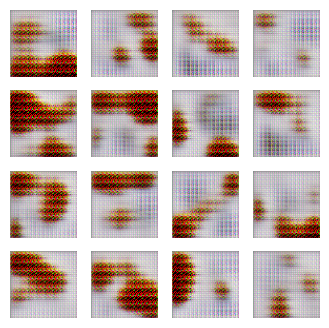

Time for epoch 6 is 40.56657028198242 sec


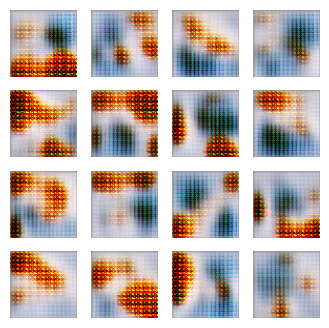

Time for epoch 7 is 40.369654178619385 sec


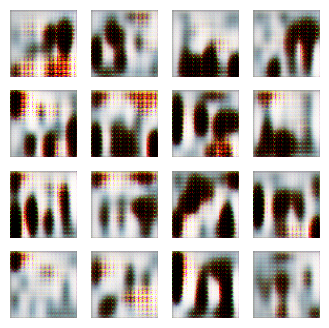

Time for epoch 8 is 40.43161368370056 sec


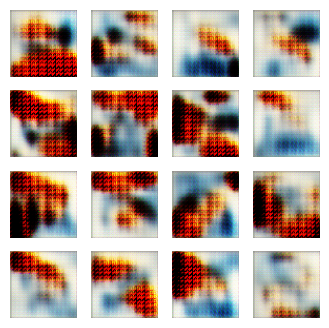

Time for epoch 9 is 40.80895519256592 sec


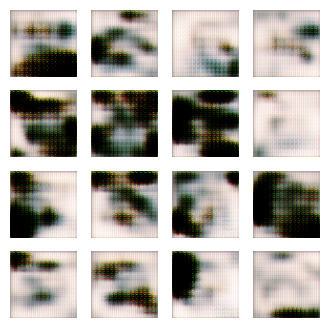

Time for epoch 10 is 40.51728963851929 sec


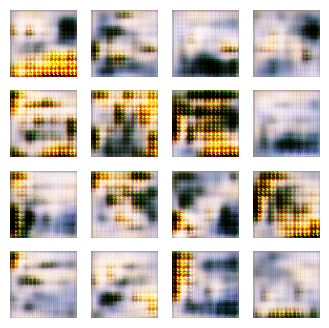

Time for epoch 11 is 40.79401135444641 sec


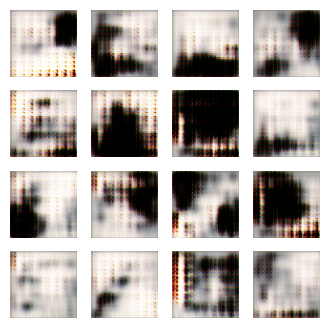

Time for epoch 12 is 40.74029898643494 sec


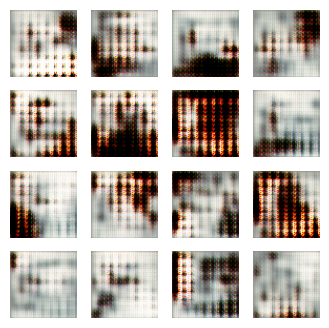

Time for epoch 13 is 40.739821434020996 sec


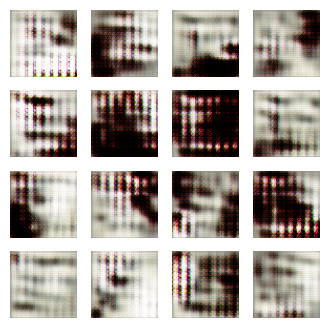

Time for epoch 14 is 40.507097244262695 sec


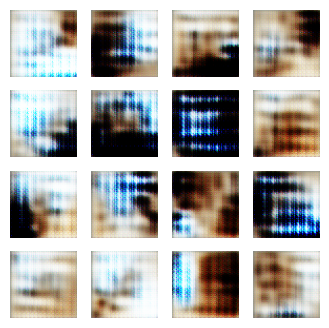

Time for epoch 15 is 40.47388482093811 sec


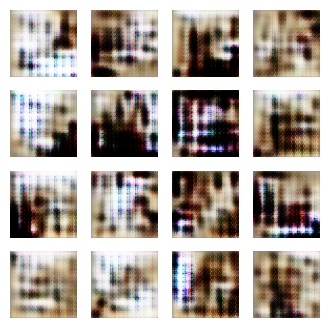

Time for epoch 16 is 40.49835968017578 sec


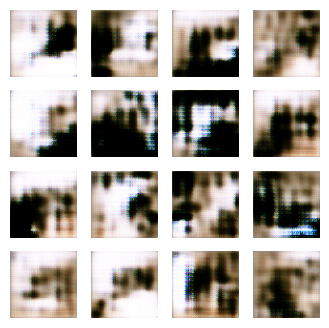

Time for epoch 17 is 40.69182205200195 sec


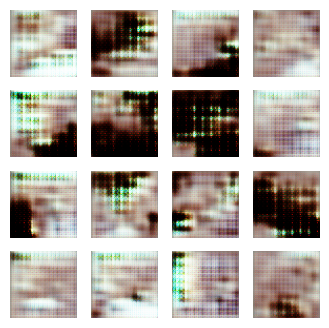

Time for epoch 18 is 41.17529034614563 sec


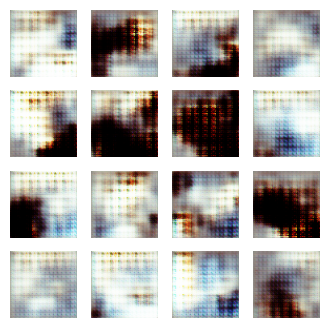

Time for epoch 19 is 40.59106159210205 sec


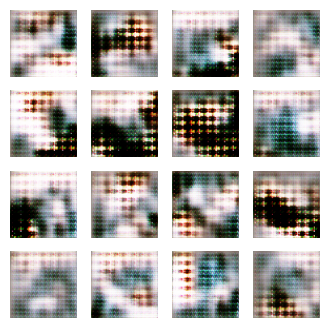

Time for epoch 20 is 40.50191688537598 sec


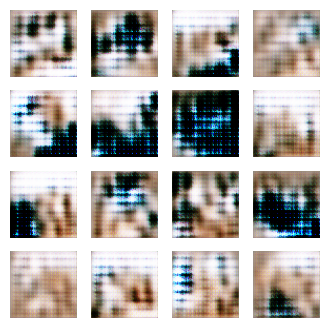

Time for epoch 21 is 40.38170671463013 sec


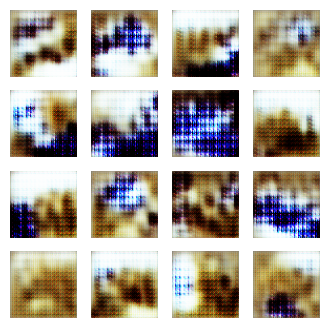

Time for epoch 22 is 40.41990113258362 sec


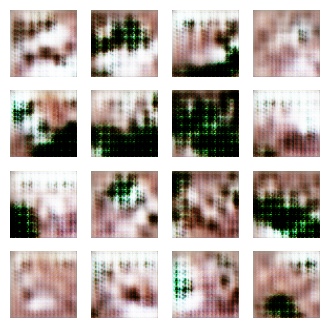

Time for epoch 23 is 40.801533460617065 sec


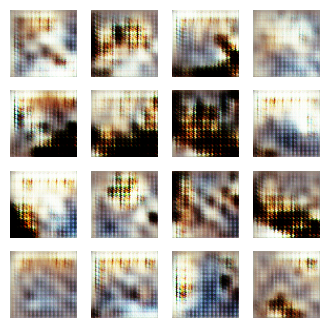

Time for epoch 24 is 40.632081270217896 sec


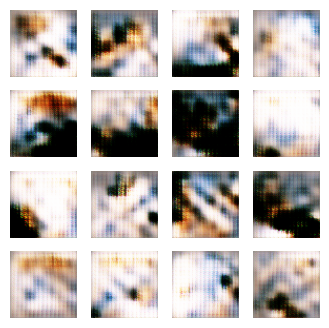

Time for epoch 25 is 40.633522510528564 sec


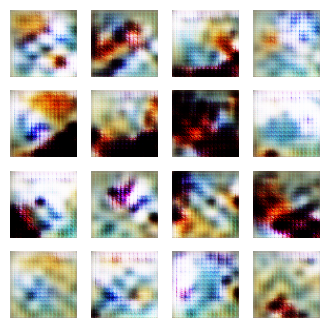

Time for epoch 26 is 40.45650672912598 sec


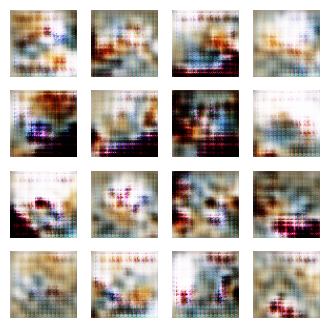

Time for epoch 27 is 40.75133562088013 sec


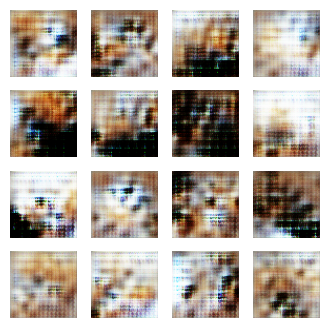

Time for epoch 28 is 40.464213848114014 sec


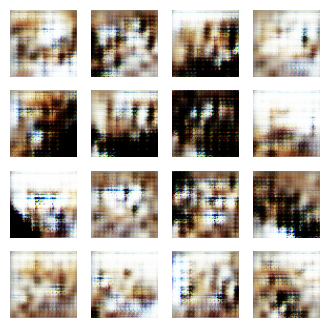

Time for epoch 29 is 40.75944471359253 sec


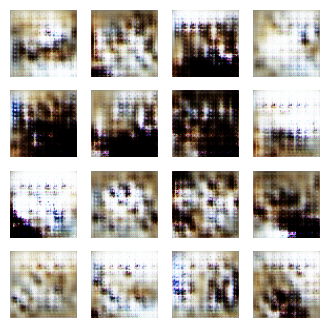

Time for epoch 30 is 40.77013182640076 sec


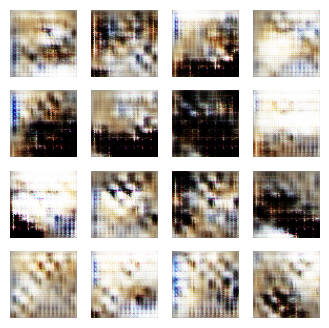

Time for epoch 31 is 40.61595344543457 sec


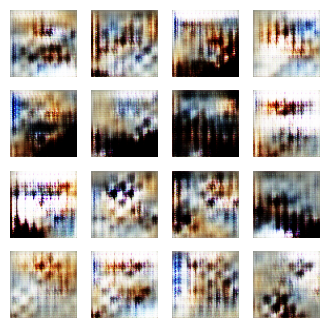

Time for epoch 32 is 40.83301901817322 sec


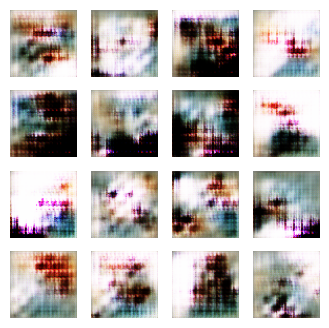

Time for epoch 33 is 40.49401807785034 sec


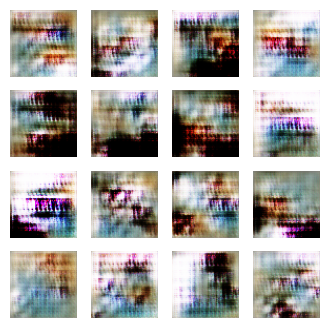

Time for epoch 34 is 40.57756853103638 sec


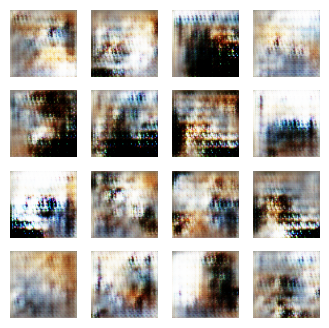

Time for epoch 35 is 40.82748818397522 sec


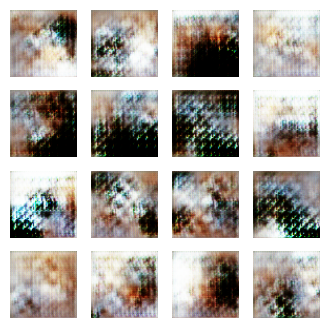

Time for epoch 36 is 41.1018168926239 sec


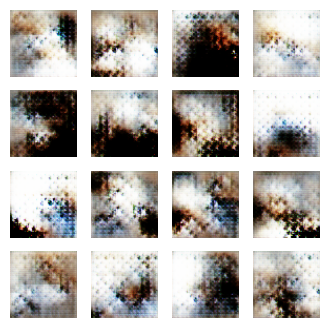

Time for epoch 37 is 40.5741503238678 sec


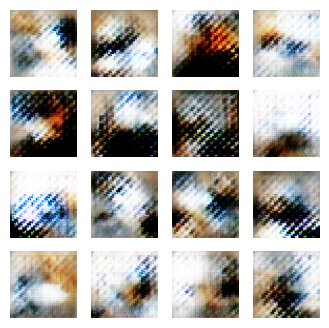

Time for epoch 38 is 40.545278787612915 sec


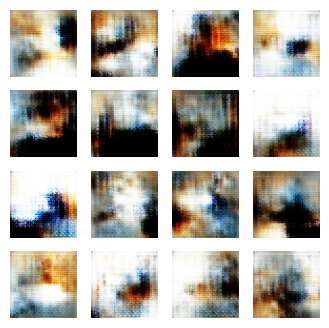

Time for epoch 39 is 40.48174047470093 sec


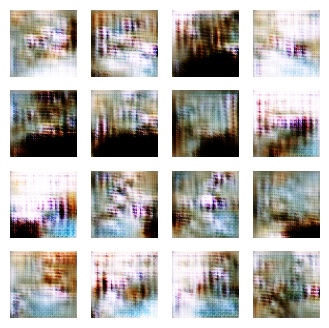

Time for epoch 40 is 40.428449869155884 sec


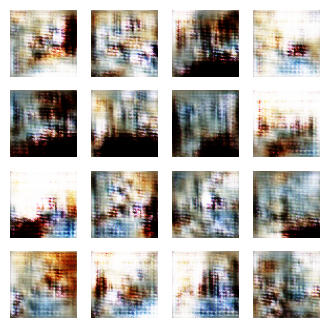

Time for epoch 41 is 41.0839467048645 sec


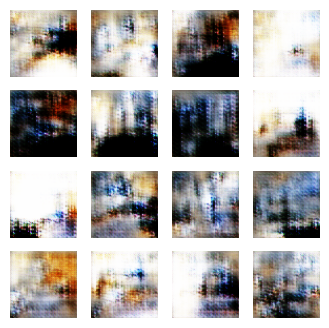

Time for epoch 42 is 40.76033139228821 sec


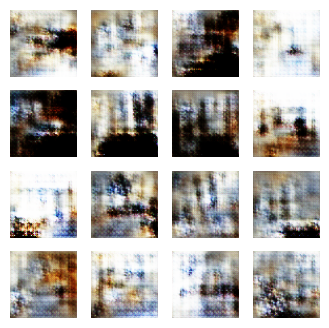

Time for epoch 43 is 40.58105826377869 sec


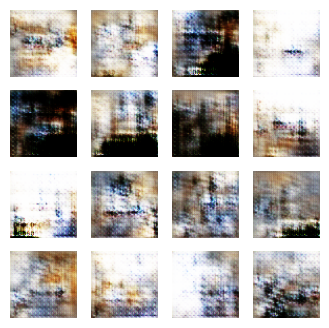

Time for epoch 44 is 40.62165665626526 sec


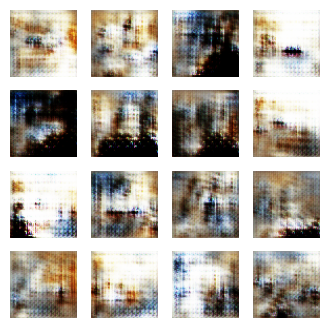

Time for epoch 45 is 40.87399339675903 sec


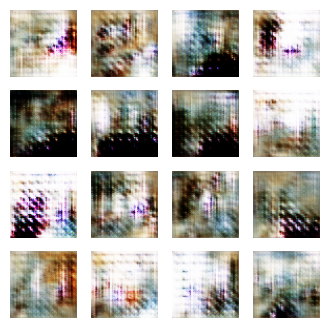

Time for epoch 46 is 40.56741976737976 sec


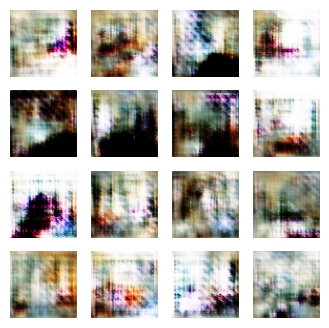

Time for epoch 47 is 40.503389835357666 sec


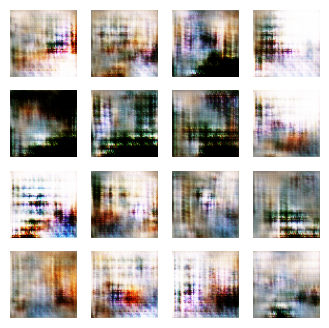

Time for epoch 48 is 40.427324056625366 sec


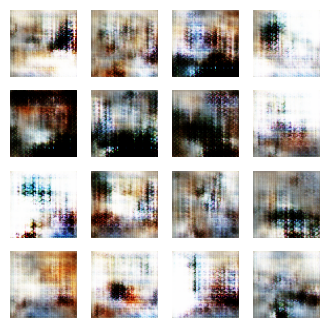

Time for epoch 49 is 40.67273926734924 sec


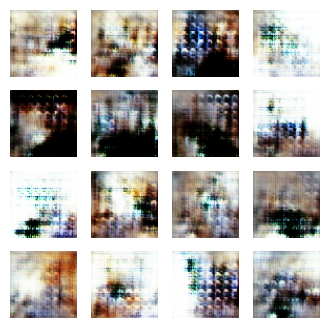

Time for epoch 50 is 41.10959720611572 sec


In [13]:
#Training
train(dataset, EPOCHS)

## 4. Using the generator to create new images

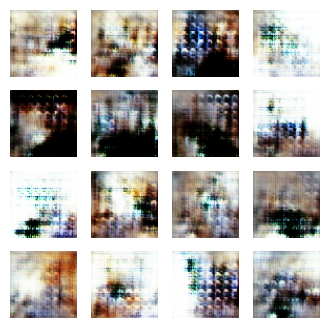

In [14]:
#Generating new images
generate_and_save_images(generator, EPOCHS, seed)

<ipython-input-12-a09adc46bed2>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)



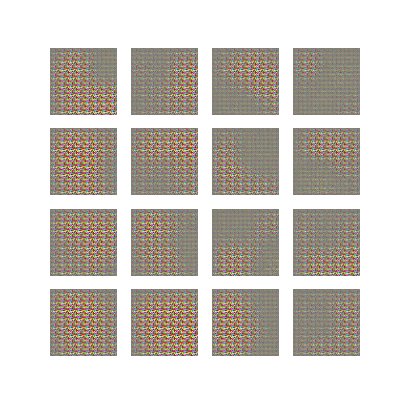

In [16]:
#Creating and displaying GIF
create_progression_gif()
embed.embed_file('progression.gif')

## Discussion Points


*   In this case, the model is capturing a variety of different bedroom styles, even though the quality of the images is not great. If a model produces high-quality images that are similar, then it could be a sign that the generator is tricking the discriminator. A solution to this problem could be to increase the dropout or add more noise.
*   I tested out the model with different subset sizes and found that increasing the subset size helps a lot with the clarity of the images. Going from the original set of 1000 to 25000, then 40000 images drastically improved the results. In order to improve the model further, I would just increase the size of the subset, which would mean longer training time. With hyperparameters, increasing the number of epochs would also improve the model but require more training time.
* GANs could be used for practical purposes, such as generating interior or exterior designs for architecture. This model specifically generates bedrooms, but GANs could be used for inspiration in any type of room. Another use could be in fashion, if it were trained with a certain type of clothing, it could generate clothing that is similar but with a design that nobody has made yet.
*   **Extra credit:** Inception score measures how well a specific image falls into a distinct class. The value is found by putting the images through an inception network. A higher score indicates a higher-quality image. In the case of images, the inception network could look for things like a bed, pillow, or lamp and then assign a value to the image based on its findings. Bedrooms that display these objects would score higher. This evaluation is only really useful for images that depict certain scenes or items that are similar. For more complex images, inception distance could be used to compare the similarity between real and generated images. Inception distance is found by passing images through an inception network that extracts features. A lower score means that the generated image is of higher quality and diverse.




